


<p style="font-size:36px;text-align:center"> <b>Personalized cancer diagnosis</b> </p>

## Data : Memorial Sloan Kettering Cancer Center (MSKCC) 


### Real World Problem 

<h3 >A malignant tumour can contain hundreds of genomic alterations after being sequenced. But the difficulty is separating the neutral mutations from the drivers, or those that lead to tumour development (passengers).
The method used up until now was manual, which requires a lot of time and work. </h3>

# 1. Objective
<p> <h3>Based on the ID (name) and variant that each gene carries, we may classify each gene into one of nine categories, some of which are related to cancerous tumours.</h3>

1. Molecular pathologist select a genetic variation to analyze(consider genetic variation as a catogrical random variable).
2. Pathologist Searches for evidence in medical literature that are relevant to genetic variation he picked
3. Analyzing each text literature corresponding to particular genes(this process is time consuming)
<h3>our work is to automate step 3 with a machine learning model</h3>.</p>

## Problem Statement
## Task: Develop algorithms for classifying genetic mutations based on clinical data (text). Predict the class in which there was a genetic mutation.

<h2> Real-world/Business objectives and constraints.</h2>

* No requirements for low latency.
* The ability to interpret is extremely important.
* Mistakes may be quite expensive.
* The likelihood that a data point belongs to each class is required.

<h1>2. Machine Learning Problem Formulation</h1>

<h3> Data </h3>

- Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment/data
-Description of files:
#### training_variants - contains a description of the genetic mutations used for training.
-Fields: ID - string identifier that is used to associate the mutation with clinical data,
-Gene - the gene in which this genetic mutation is located, 
-Variation - amino acid change for this mutation, 
-Class - 1-9 class in which this genetic mutation was classified
#### training_text- is a double-pipe (||) delimited file containing clinical data (text) used to classify genetic mutations. 
-Fields: ID - identifier of the string used to associate clinical data with a genetic mutation.
-Text - clinical data used to classify a genetic mutation)
#### test_variants - contains a description of the genetic mutations used for training. 
-ID - string identifier that is used to associate the mutation with clinical data
-Gene - the gene in which this genetic mutation is located, 
-Variation - amino acid change for this mutation
#### test_text is a double pipe delimited file (||) containing clinical data (text) used to classify genetic mutations.
-Fields: ID - identifier of the string used to associate clinical data with a genetic mutation, 
-Text - clinical data used to classify a genetic mutation)
-<p> 
    Data file's information:
    <ul> 
        <li>
        training_variants (ID , Gene, Variations, Class)
        </li>
        <li>
        training_text (ID, Text)
        </li>
    </ul>
</p>

<h3>Type of Machine Learning Problem</h3>

<p>
     Genetic mutations can be categorised into nine separate classes. => Multi class classification Problem.
    
</p>

<h3>Performance Metric</h3>

Source: https://www.kaggle.com/c/msk-redefining-cancer-treatment#evaluation

Metric(s): 
* Multi class log-loss 
* Confusion matrix 


## 2.1 Loading Data:

<p> A csv file containing the features is created and stored.
This notebook's dataframe contains the generated csv file.</p>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import time
import warnings
import string
from nltk.corpus import stopwords
import nltk
from collections import Counter
from nltk.stem.porter import PorterStemmer
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
pd.set_option('display.max_columns', None)
plt.rcParams['figure.figsize'] = (12,6)

In [2]:
data_variant = pd.read_csv('training_variants')
data_variant.sample(7)

,ID,Gene,Variation,Class
3019,3019,KIT,V852I,2
3172,3172,RAF1,S257W,7
2531,2531,BRCA1,S1497A,5
2103,2103,CDK12,D887N,1
1060,1060,EWSR1,EWSR1-ETV1 Fusion,7
37,37,DICER1,D1709E,1
456,456,TP53,R158H,4


In [3]:
data_text =pd.read_csv("training_text",sep="\|\|",engine="python",names=["ID","TEXT"],skiprows=1)
data_text.sample(7)

,ID,TEXT
1579,1579,Introduction Familial essential thrombocythem...
2825,2825,Mutation screening of the breast and ovarian c...
908,908,Purpose: Platelet-derived growth factor recept...
640,640,Relationship between the p27Kip1 (here after r...
2725,2725,Genes crucial for cancer development can be mu...
1961,1961,Abstract Nucleoporins (NUPs) are essential co...
544,544,Activation of the canonical TGF-β signaling pa...


## 3. Familiarizing with Data
#### In this step, few dataframe methods are used to look into the data and its features.

In [4]:
print('Number of data points : ', data_variant.shape[0])
print('Number of features : ', data_variant.shape[1])
print('Features : ', data_variant.columns.values)
print(data_variant.shape)

Number of data points :  3321
Number of features :  4
Features :  ['ID' 'Gene' 'Variation' 'Class']
(3321, 4)


In [5]:
print('Number of data points : ', data_text.shape[0])
print('Number of features : ', data_text.shape[1])
print('Features : ', data_text.columns.values)
print(data_text.shape)

Number of data points :  3321
Number of features :  2
Features :  ['ID' 'TEXT']
(3321, 2)


## 3.1. Text Data Preprocessing
##### We have a tonne of textual information. Therefore, we must preprocess it. Therefore, let's create a function for it.

- reference https://www.kaggle.com/code/sudalairajkumar/getting-started-with-text-preprocessing/notebook

In [6]:
counter = 0
with open("training_text",encoding="utf8") as infile:
    while True:
        counter += 1
        line = infile.readline()
        print(line)
        if counter==2:
            break

ID,Text

0||Cyclin-dependent kinases (CDKs) regulate a variety of fundamental cellular processes. CDK10 stands out as one of the last orphan CDKs for which no activating cyclin has been identified and no kinase activity revealed. Previous work has shown that CDK10 silencing increases ETS2 (v-ets erythroblastosis virus E26 oncogene homolog 2)-driven activation of the MAPK pathway, which confers tamoxifen resistance to breast cancer cells. The precise mechanisms by which CDK10 modulates ETS2 activity, and more generally the functions of CDK10, remain elusive. Here we demonstrate that CDK10 is a cyclin-dependent kinase by identifying cyclin M as an activating cyclin. Cyclin M, an orphan cyclin, is the product of FAM58A, whose mutations cause STAR syndrome, a human developmental anomaly whose features include toe syndactyly, telecanthus, and anogenital and renal malformations. We show that STAR syndrome-associated cyclin M mutants are unable to interact with CDK10. Cyclin M silencing pheno

<h4>Predicting the class of the mutation given the content in the literature is the main task at hand. Then, we'll try different NLP methods to turn the free text into features for an ML classifier to evaluate which ones perform the best.</h4>

In [100]:
# loading stop words from nltk library
    
def preprocessing_text(text,index, column):
    PUNCT_TO_REMOVE = string.punctuation
    STOPWORDS = set(stopwords.words('english'))
    
   # Convert text to lowercase
    text = text.lower()
    
    #Remove punctuation characters, we don't need them
    text = text.translate(str.maketrans('', '', PUNCT_TO_REMOVE))
    
   #Remove stopwords
    text = " ".join([word for word in str(text).split() if word not in STOPWORDS])
    # replace every special char with space
    text = re.sub('[^a-zA-Z0-9\n]', ' ', text)
    # replace multiple spaces with single space
    text = re.sub('\s+',' ', text)
    
    
    #Remove rare words
    cnt = Counter()
    n_rare_words = 10
    RAREWORDS = set([w for (w, wc) in cnt.most_common()[:-n_rare_words-1:-1]])
    text = " ".join([word for word in str(text).split() if word not in RAREWORDS])
    
    #Stemming - convert words to base form

    #stemmer = PorterStemmer()
    #text = " ".join([stemmer.stem(word) for word in text.split()])
    
    #Lemmatization - similar to stemming, but guaranteeing that the word belongs to this language is slower
    #lemmatizer = WordNetLemmatizer()
    data_text[column][index] = text

In [109]:
#data_text['clean_text']=data_text.TEXT.apply(lambda x: preprocessing_text(x))
start_time = time.process_time()
for index, row in data_text.iterrows():
    if type(row['TEXT']) is str:
        preprocessing_text(row['TEXT'], index, 'TEXT')
    else:
        print("there is no text description for id:",index)      
print('Duration of text preprocessing :',time.process_time() - start_time, "seconds")

C:\Users\reetu raj harsh\AppData\Local\Temp\ipykernel_14236\3738656901.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_text[column][index] = text


there is no text description for id: 1109
there is no text description for id: 1277
there is no text description for id: 1407
there is no text description for id: 1639
there is no text description for id: 2755
Duration of text preprocessing : 27.953125 seconds


In [110]:
df_train = pd.merge(data_variant, data_text, how = 'left', on = 'ID').fillna('')
df_train.head()

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating Mutations,1,frequent mutations associated leukemia recurre...
1,1,CBL,W802*,2,abstract background nonsmall cell lung cancer ...
2,2,CBL,Q249E,2,abstract background nonsmall cell lung cancer ...
3,3,CBL,N454D,3,recent evidence demonstrated acquired uniparen...
4,4,CBL,L399V,4,oncogenic mutations monomeric casitas blineage...


In [111]:
df_train.shape

(3321, 5)

In [112]:
df_train[df_train.isnull().any(axis=1)]

,ID,Gene,Variation,Class,TEXT


In [113]:
#Full Information Of Dataset
float_cols = df_train.select_dtypes('float64').columns
for c in float_cols:
    df_train[c] = df_train[c].astype('float32')
    
int_cols = df_train.select_dtypes('int64').columns
for c in int_cols:
    df_train[c] = df_train[c].astype('int32')
    
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3321 entries, 0 to 3320
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ID         3321 non-null   int32 
 1   Gene       3321 non-null   object
 2   Variation  3321 non-null   object
 3   Class      3321 non-null   int32 
 4   TEXT       3321 non-null   object
dtypes: int32(2), object(3)
memory usage: 129.7+ KB


In [114]:
### Function for counting a word in a text, can be used as an additional feature generation

def count_words(TEXT, Gene_Var):
    wordlist = TEXT.split(' ')
    cnt = 0
    for s in wordlist:
        if (Gene_Var==s):
            cnt+=1
    return cnt

In [115]:
#replacing Null values
df_train.loc[df_train['TEXT'].isnull(),'TEXT'] = df_train['Gene'] +' '+df_train['Variation']

In [119]:
df_train[df_train['ID']==1108]

,ID,Gene,Variation,Class,TEXT
1108,1108,FANCA,S858R,4,fanconi anemia fa autosomal recessive disease ...


##### We want to ensure that all spaces in Gene and Variation column to be replaced by _.

In [123]:
y_true = df_train['Class'].values
df_train.Gene      = df_train.Gene.str.replace('\s+', '_')
df_train.Variation = df_train.Variation.str.replace('\s+', '_')

C:\Users\reetu raj harsh\AppData\Local\Temp\ipykernel_14236\2163118870.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df_train.Gene      = df_train.Gene.str.replace('\s+', '_')
C:\Users\reetu raj harsh\AppData\Local\Temp\ipykernel_14236\2163118870.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  df_train.Variation = df_train.Variation.str.replace('\s+', '_')


In [124]:
df_train.head()

,ID,Gene,Variation,Class,TEXT
0,0,FAM58A,Truncating_Mutations,1,frequent mutations associated leukemia recurre...
1,1,CBL,W802*,2,abstract background nonsmall cell lung cancer ...
2,2,CBL,Q249E,2,abstract background nonsmall cell lung cancer ...
3,3,CBL,N454D,3,recent evidence demonstrated acquired uniparen...
4,4,CBL,L399V,4,oncogenic mutations monomeric casitas blineage...


#### Splitting data into train, test and cross validation (64:20:16)

In [125]:
from sklearn.model_selection import GridSearchCV, train_test_split, ShuffleSplit, KFold

# split the data into test and train by maintaining same distribution of output varaible 'y_true' [stratify=y_true]
X_train, test_df, y_train, y_test = train_test_split(df_train, y_true, stratify=y_true, test_size=0.2)

# split the train data into train and cross validation by maintaining same distribution of output varaible 'y_train' [stratify=y_train]
train_df, cv_df, y_train, y_cv = train_test_split(X_train, y_train, stratify=y_train, test_size=0.2)

In [126]:
train_df.shape

(2124, 5)

In [127]:
test_df.shape

(665, 5)

In [128]:
cv_df.shape

(532, 5)

## 3.2 Distribution of class in diffrent dataset

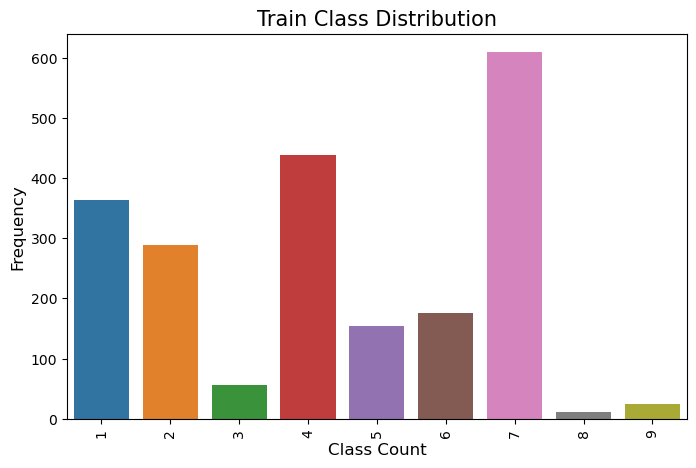

In [129]:
train_class_distribution = train_df['Class'].value_counts().sort_index()
plt.figure(figsize=(8,5))
sns.countplot(x="Class", data=train_df)
plt.ylabel('Frequency', fontsize=12)
plt.xlabel('Class Count', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Train Class Distribution", fontsize=15)
plt.show()

In [130]:
sorted_train = np.argsort(-train_class_distribution.values)
for i in sorted_train:
    print('Number of data points in class', i+1, ':',train_class_distribution.values[i],
          '(', np.round((train_class_distribution.values[i]/train_df.shape[0]*100), 3), '%)')

Number of data points in class 7 : 609 ( 28.672 %)
Number of data points in class 4 : 439 ( 20.669 %)
Number of data points in class 1 : 363 ( 17.09 %)
Number of data points in class 2 : 289 ( 13.606 %)
Number of data points in class 6 : 176 ( 8.286 %)
Number of data points in class 5 : 155 ( 7.298 %)
Number of data points in class 3 : 57 ( 2.684 %)
Number of data points in class 9 : 24 ( 1.13 %)
Number of data points in class 8 : 12 ( 0.565 %)


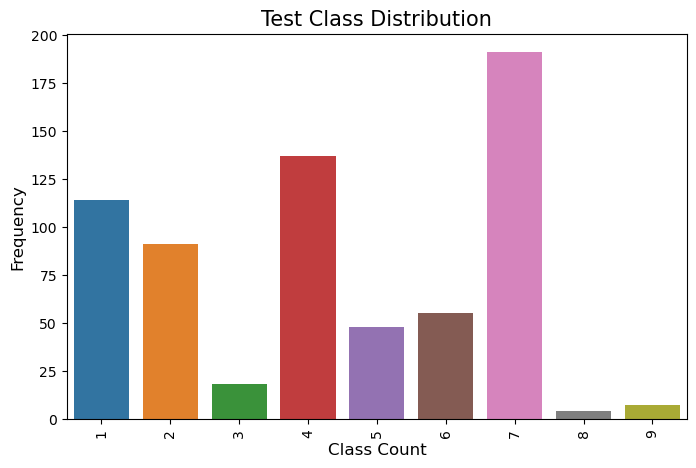

In [131]:
test_class_distribution = test_df['Class'].value_counts().sort_index()
plt.figure(figsize=(8,5))
sns.countplot(x="Class", data=test_df)
plt.ylabel('Frequency', fontsize=12)
plt.xlabel('Class Count', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Test Class Distribution", fontsize=15)
plt.show()

In [132]:
sorted_test = np.argsort(-test_class_distribution.values)
for i in sorted_test:
    print('Number of data points in class', i+1, ':',test_class_distribution.values[i],
          '(', np.round((test_class_distribution.values[i]/test_df.shape[0]*100), 3), '%)')

Number of data points in class 7 : 191 ( 28.722 %)
Number of data points in class 4 : 137 ( 20.602 %)
Number of data points in class 1 : 114 ( 17.143 %)
Number of data points in class 2 : 91 ( 13.684 %)
Number of data points in class 6 : 55 ( 8.271 %)
Number of data points in class 5 : 48 ( 7.218 %)
Number of data points in class 3 : 18 ( 2.707 %)
Number of data points in class 9 : 7 ( 1.053 %)
Number of data points in class 8 : 4 ( 0.602 %)


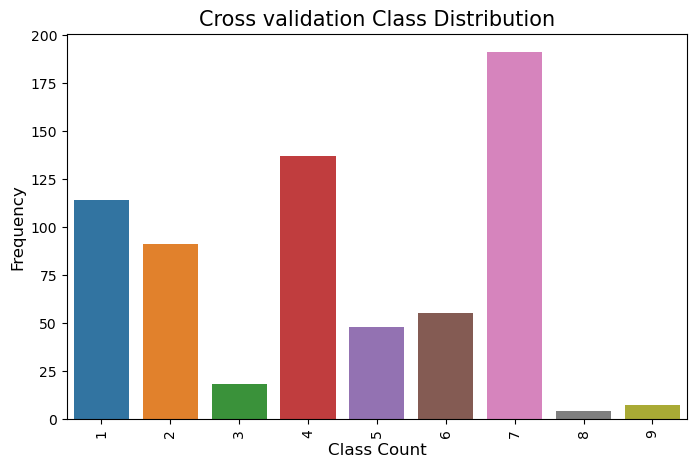

In [133]:
cv_class_distribution = cv_df['Class'].value_counts().sort_index()
plt.figure(figsize=(8,5))
sns.countplot(x="Class", data=test_df)
plt.ylabel('Frequency', fontsize=12)
plt.xlabel('Class Count', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("Cross validation Class Distribution", fontsize=15)
plt.show()

In [134]:
sorted_cv = np.argsort(-train_class_distribution.values)
for i in sorted_cv:
    print('Number of data points in class', i+1, ':',cv_class_distribution.values[i],
          '(', np.round((cv_class_distribution.values[i]/cv_df.shape[0]*100), 3), '%)')

Number of data points in class 7 : 153 ( 28.759 %)
Number of data points in class 4 : 110 ( 20.677 %)
Number of data points in class 1 : 91 ( 17.105 %)
Number of data points in class 2 : 72 ( 13.534 %)
Number of data points in class 6 : 44 ( 8.271 %)
Number of data points in class 5 : 39 ( 7.331 %)
Number of data points in class 3 : 14 ( 2.632 %)
Number of data points in class 9 : 6 ( 1.128 %)
Number of data points in class 8 : 3 ( 0.564 %)


### 4. Random Model Generation

##### The idea behind random model is to create a reference error value (True - Generated), based on randomly generated value This reference error gives a sense of how well our build model performce against the randomly generated values

#### How we construct random model for our multiclassification case:

- Generate series filled with random probabilities
- Probabilities a distribute randomly across classes (1-9)
- Log_loss is used to measure the accuracy ( Submission requires log loss )

<p>
We shall create 9 random integers from 1 to 9 to represent the 9 output classes for this application. To indicate the probability for each class, we will add these nine values and divide them by the total. we will select the highest probability value, draw a confusion matrix, and compute the total log-loss.
    
The idea behind random model is to create a reference error value (True - Generated), based on randomly generated value This reference error gives a sense of how well our build model performce against the randomly generated values

How we construct random model for our multiclassification case:

Generate series filled with random probabilities
Probabilities a distribute randomly across classes (1-9)
Log_loss is used to measure the accuracy ( Submission requires log loss )

We begin by defining a function for visualising the confusion matrix:
The purpose of the random model is to generate a reference error value (True - Generated), which measures how well our built model performs in comparison to the randomly generated data.

How we build a random model in our multiclassification example

Create a series with random probabilities in it.
Probabilities are randomly distributed throughout the classes (1-9)
Accuracy is measured by log loss ( Submission requires log loss )</p>

In [135]:
from sklearn.metrics import log_loss
test_data_len = test_df.shape[0]
cv_len = cv_df.shape[0]

#we establish an output array that has precisely same size as the CV data
cv_predicted_y = np.zeros((cv_len,9))
for i in range(cv_len):
    random_prob = np.random.rand(1,9)
    cv_predicted_y[i] = ((random_prob/random_prob.sum())[0])

cv_log_loss = round(log_loss(y_cv,cv_predicted_y, eps=1e-15),2)

print("Log loss on Cross Validation Data using Random Model",cv_log_loss)


test_predicted_y = np.zeros((test_data_len,9))
for i in range(test_data_len):
    random_prob = np.random.rand(1,9)
    test_predicted_y[i] = ((random_prob/random_prob.sum())[0])
test_log_loss = round(log_loss(y_test,test_predicted_y, eps=1e-15),2)

print("Log loss on Test Data using Random Model",test_log_loss)

Log loss on Cross Validation Data using Random Model 2.48
Log loss on Test Data using Random Model 2.51


It appears that 2.5 will serve as our main basis. Our model performs poorly the closer its log loss is approaching 2.5!

The following matrices will be used to assess the performance of random and subsequently actual ML models:

- Confusion Matrix
In plain language, the confusion matrix is used to gauge how accurately our model classifies input.
Diagonally organised cells will have a stronger correlation if models are successful.
- Recall Matrix
In layman's terms, it refers to a model's capacity to locate all the relevant data points in a dataset.
True Positive / (True Positive + False Negative) in mathematics
- Precision Matrix
In layman's terms, precision identifies the percentage of data items that the model qualifies as relevant as being relevant
In mathematics, the formula is True Positive / (True Positive + False Positive).

In [136]:
predicted_y =np.argmax(test_predicted_y, axis=1)
# Because class values range from 0 to 8. Additionally, there are numbers 1 through 9. The n+1 formula will convert it to 1–9.
predicted_y = predicted_y+1

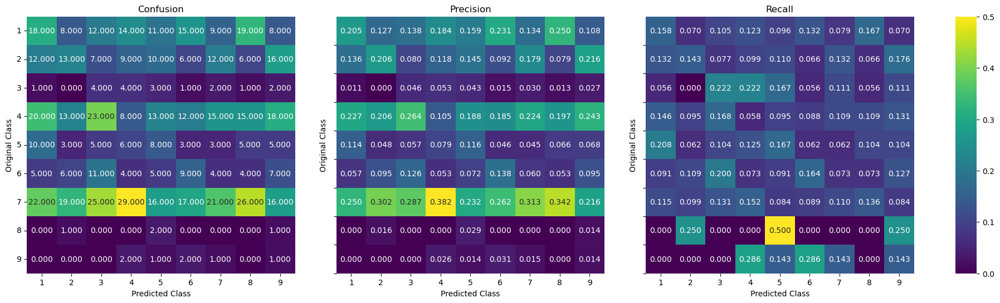

In [137]:
from sklearn.metrics import confusion_matrix

def plot_matrices(y_test,predicted_y):  

    confusion = confusion_matrix(y_test, predicted_y)
    precision =(confusion/confusion.sum(axis=0))
    recall =(((confusion.T)/(confusion.sum(axis=1))).T)
    
    f,(ax1,ax2,ax3, axcb) = plt.subplots(1,4, 
                gridspec_kw={'width_ratios':[1,1,1,0.08]},figsize=(22,6))
    
    labels = [1,2,3,4,5,6,7,8,9]
    
    g1 = sns.heatmap(confusion,cbar=False,ax=ax1,annot=True, cmap="viridis", fmt=".3f", xticklabels=labels, yticklabels=labels,)
    g1.set_ylabel('Original Class')
    g1.set_xlabel('Predicted Class')
    g1.set_title('Confusion')
    g2 = sns.heatmap(precision,cmap="viridis",cbar=False,ax=ax2, annot=True,fmt=".3f", xticklabels=labels, yticklabels=labels)
    g2.set_ylabel('Original Class')
    g2.set_xlabel('Predicted Class')
    g2.set_yticks(labels)
    g2.set_title('Precision')
    g3 = sns.heatmap(recall,cmap="viridis",ax=ax3, cbar_ax=axcb, annot=True, fmt=".3f", xticklabels=labels, yticklabels=labels)
    g3.set_ylabel('Original Class')
    g3.set_xlabel('Predicted Class')
    g3.set_title('Recall')
    g3.set_yticks(labels)
    
    for ax in [g1,g2,g3]:
        tl = ax.get_xticklabels()
        ax.set_xticklabels(tl, rotation=0)
        tly = ax.get_yticklabels()
        ax.set_yticklabels(tly, rotation=0)
    
    plt.show()

plot_matrices(y_test,predicted_y)

<p>
In the present confusion matrix, three data points for class 1 correspond to the original and anticipated classes. There are 8 data points in class 2 that fit both the original and anticipated classes, and so on. As a result, utilising the confusion matrix provides a more accurate representation of the model's performance than simply looking at a single number of log loss. As you are aware, the model is regarded to be optimally adjusted if all diagonal values are high.</p>

 # 5. Feature Evaluation

## Define Evaluating Functions:
 - Evaluation Model:
- Stochastic Gradient Descent classifier
- Logistic Regression (sigmoid)
- Calibrated Classifier - Post Processing the model to improve probability estimates
- Use onehotCoding
- Penalty='l2'
- Below are the functions that will help us with evaluating our features

### 5.1Gene column evaluation
- Examine the word distribution.
- String data must be transformed to numeric data before the ML technique can be used.
- Encoding Method: One-hot Encoding

In [138]:
train_df.Gene.unique()

array(['PIK3R1', 'JAK2', 'SMO', 'PTEN', 'MET', 'EP300', 'POLE', 'FGFR2',
       'BRCA2', 'NKX2-1', 'MLH1', 'MTOR', 'RHOA', 'BRCA1', 'MPL',
       'CDKN2A', 'FBXW7', 'TP53', 'RUNX1', 'ABL1', 'CBL', 'EGFR', 'STK11',
       'SPOP', 'PMS2', 'PDGFRB', 'TGFBR1', 'PDGFRA', 'KIT', 'PIK3CA',
       'ALK', 'ERBB4', 'TGFBR2', 'MAP2K2', 'EWSR1', 'VHL', 'ETV1', 'RAC1',
       'RET', 'EZH2', 'BAP1', 'SETD2', 'CDK12', 'KRAS', 'BRAF', 'PIK3R2',
       'PTPRT', 'ERCC2', 'SMAD2', 'TSC2', 'AKT2', 'RAD51C', 'CDKN2B',
       'BCL2L11', 'MAP2K1', 'BCOR', 'BCL10', 'PPP2R1A', 'AKT1', 'RASA1',
       'NOTCH1', 'PIK3CB', 'NFE2L2', 'TET2', 'PBRM1', 'FLT3', 'ERCC4',
       'SMAD3', 'FGFR3', 'LATS2', 'SOS1', 'SF3B1', 'ETV6', 'YAP1',
       'GATA3', 'ERBB2', 'IKBKE', 'PTPN11', 'NOTCH2', 'RBM10', 'APC',
       'FGFR1', 'ERBB3', 'CTNNB1', 'NUP93', 'CCND3', 'MSH2', 'PIM1',
       'ARAF', 'B2M', 'SMAD4', 'ESR1', 'KEAP1', 'NTRK1', 'TSC1', 'DNMT3B',
       'H3F3A', 'CTCF', 'NTRK3', 'ATRX', 'CIC', 'ERG', 'DICER1', 'CDKN1B

In [139]:
genecount =train_df['Gene'].value_counts()
genecount

BRCA1      172
TP53       105
EGFR        96
PTEN        83
BRCA2       72
          ... 
WHSC1        1
FOXL2        1
MYCN         1
BCL2L11      1
CDKN2C       1
Name: Gene, Length: 237, dtype: int64

In [140]:
genecount.shape

(237,)

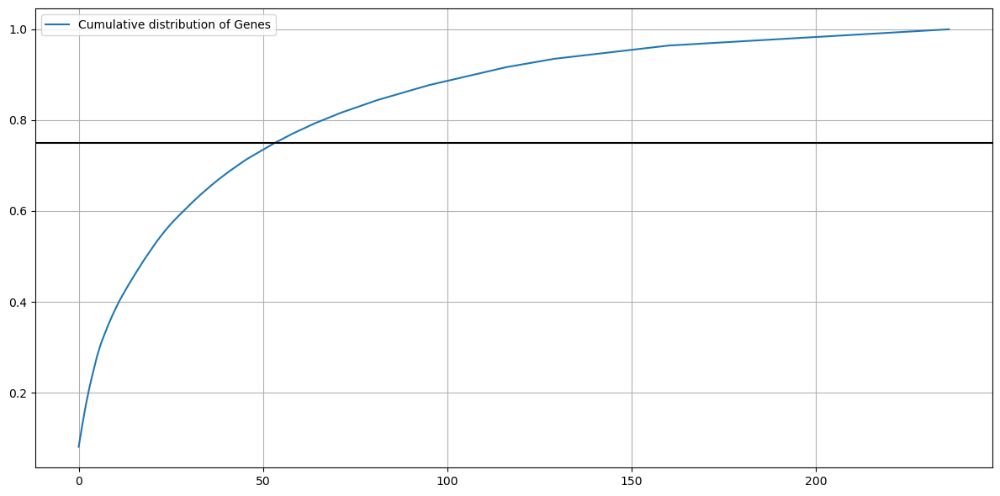

In [141]:
total_unique_values = sum(genecount.values);
percent_per_total = genecount.values/total_unique_values;
cumulative = np.cumsum(percent_per_total)
plt.plot(cumulative,label='Cumulative distribution of Genes',)

plt.grid()
plt.axhline(0.75, color='k')
plt.legend()
plt.tight_layout()
plt.show()


###### Looks like 75% of data consists of approximately 50 most common words.

In [142]:
# code for response coding with Laplace smoothing.
# alpha : used for laplace smoothing
# feature: ['gene', 'variation']
# df: ['train_df', 'test_df', 'cv_df']
# algorithm
# ----------
# Consider all unique values and the number of occurances of given feature in train data dataframe
# build a vector (1*9) , the first element = (number of times it occured in class1 + 10*alpha / number of time it occurred in total data+90*alpha)
# gv_dict is like a look up table, for every gene it store a (1*9) representation of it
# for a value of feature in df:
# if it is in train data:
# we add the vector that was stored in 'gv_dict' look up table to 'gv_fea'
# if it is not there is train:
# we add [1/9, 1/9, 1/9, 1/9,1/9, 1/9, 1/9, 1/9, 1/9] to 'gv_fea'
# return 'gv_fea'
# ----------------------

# get_gv_fea_dict: Get Gene varaition Feature Dict
def get_gv_fea_dict(alpha, feature, df):
    value_count = train_df[feature].value_counts()
    
    # gv_dict : Gene Variation Dict, which contains the probability array for each gene/variation
    gv_dict = dict()
    
    # denominator will contain the number of time that particular feature occured in whole data
    for i, denominator in value_count.items():
        # vec will contain (p(yi==1/Gi) probability of gene/variation belongs to perticular class
        # vec is 9 diamensional vector
        vec = []
        for k in range(1,10):
            # print(train_df.loc[(train_df['Class']==1) & (train_df['Gene']=='BRCA1')])
            #         ID   Gene             Variation  Class  
            # 2470  2470  BRCA1                S1715C      1   
            # 2486  2486  BRCA1                S1841R      1   
            # 2614  2614  BRCA1                   M1R      1   
            # 2432  2432  BRCA1                L1657P      1   
            # 2567  2567  BRCA1                T1685A      1   
            # 2583  2583  BRCA1                E1660G      1   
            # 2634  2634  BRCA1                W1718L      1   
            # cls_cnt.shape[0] will return the number of rows

            cls_cnt = train_df.loc[(train_df['Class']==k) & (train_df[feature]==i)]
            
            # cls_cnt.shape[0](numerator) will contain the number of time that particular feature occured in whole data
            vec.append((cls_cnt.shape[0] + alpha*10)/ (denominator + 90*alpha))

        # we are adding the gene/variation to the dict as key and vec as value
        gv_dict[i]=vec
    return gv_dict

# Get Gene variation feature
def get_gv_feature(alpha, feature, df):
    gv_dict = get_gv_fea_dict(alpha, feature, df)
    # value_count is similar in get_gv_fea_dict
    value_count = train_df[feature].value_counts()
    
    # gv_fea: Gene_variation feature, it will contain the feature for each feature value in the data
    gv_fea = []
    # for every feature values in the given data frame we will check if it is there in the train data then we will add the feature to gv_fea
    # if not we will add [1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9] to gv_fea
    for index, row in df.iterrows():
        if row[feature] in dict(value_count).keys():
            gv_fea.append(gv_dict[row[feature]])
        else:
            gv_fea.append([1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9,1/9])
#             gv_fea.append([-1,-1,-1,-1,-1,-1,-1,-1,-1])
    return gv_fea

In [143]:
#response-coding of the Gene feature
# alpha is used for laplace smoothing
alpha = 1
# train gene feature
train_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", train_df))
# test gene feature
test_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", test_df))
# cross validation gene feature
cv_gene_feature_responseCoding = np.array(get_gv_feature(alpha, "Gene", cv_df))

In [144]:
train_gene_feature_responseCoding.shape

(2124, 9)

In [145]:
# Gene' featureVectorizing 
from sklearn.feature_extraction.text import CountVectorizer

g_vectorizer = CountVectorizer()
train_gene_feature_onehotCoding =  g_vectorizer.fit_transform(train_df['Gene'])
test_gene_feature_onehotCoding  =  g_vectorizer.transform(test_df['Gene'])
cv_gene_feature_onehotCoding    =  g_vectorizer.transform(cv_df['Gene'])

In [146]:
train_gene_feature_onehotCoding.shape

(2124, 237)

##### Evaluating Functions Definition:
- Testing Framework:
- Gradient Stochastic Classifier for descent
- Calibrated Logistic Regression (sigmoid) Classifier - Post-processing the model to enhance probability estimations
- Penalty='l2' for onehotCoding
- The functions listed below will assist us in assessing our features.

In [147]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV

def alpha_loss(alpha,train_feat_hotencode,cv_feat_hotencode):
    """
    Input: Hyperparameter Alpha, Train_Feature_onehotencoded, CV_Feature_onehotencoded
    Output: Hyperparameter Tunning DataFrame 
    """
    cv_log_error_array=[]
    for i in alpha:
        clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
        clf.fit(train_feat_hotencode, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    
    # 
        sig_clf.fit(train_feat_hotencode, y_train)
        predict_y = sig_clf.predict_proba(cv_feat_hotencode)
    
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    temp_df = pd.DataFrame(data={'alpha': np.round(alpha,5), 
                                 'cv_log_loss': np.round(cv_log_error_array,5)})
    return temp_df

In [148]:
def all_set(name,best_alpha,
                 train_feat_hotencode,
                 cv_feat_hotencode,
                 test_feat_hotencode):
    '''
    Input: Feature name, Best Alpha, and All 3 OneHotEncoded Sets 
    Output: Log-Loss Report data frame
    '''
    # Model
    clf = SGDClassifier(alpha=best_alpha, penalty='l2', loss='log', random_state=42)
    clf.fit(train_feat_hotencode, y_train)
    sigmoid_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sigmoid_clf.fit(train_feat_hotencode, y_train)
    
    train_predict_y = sigmoid_clf.predict_proba(train_feat_hotencode)
    train_log_loss = np.round(log_loss(y_train, train_predict_y, labels=clf.classes_, eps=1e-15),3)

    cv_predict_y = sigmoid_clf.predict_proba(cv_feat_hotencode)
    cv_log_loss = np.round(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    test_predict_y = sigmoid_clf.predict_proba(test_feat_hotencode)
    test_log_loss = np.round(log_loss(y_test, test_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    report_log_loss=[name,
                     best_alpha,
                     train_log_loss,
                     cv_log_loss,
                     test_log_loss]
    
    temp_df = pd.DataFrame([report_log_loss],columns=['Feature','best alpha','train_log_loss','cv_log_loss','test_log_loss' ])   
    return temp_df

In [149]:
test_train_cover=test_df[test_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]
cv_train_cover=cv_df[cv_df['Gene'].isin(list(set(train_df['Gene'])))].shape[0]
test_train_olap = np.round(test_train_cover*100/test_df.shape[0],1)
cv_train_olap =  np.round(cv_train_cover*100/cv_df.shape[0],1)


olap= pd.DataFrame(data=[[test_train_olap,cv_train_olap]],columns=['Test-Train Data Overlap[%]','CV-Train Data Overlap[%]'])

# Evaluating Gene Feature
alpha = [10 ** x for x in range(-5, 1)]
# Tunning Hyper Parameter (Alpha)
tunning_df = alpha_loss(alpha,train_gene_feature_onehotCoding,cv_gene_feature_onehotCoding)
# Selecting Best Alpha
best_alpha = tunning_df.loc[tunning_df['cv_log_loss'] == tunning_df['cv_log_loss'].min(), 'alpha'].item()

# Calculating Log_Loss for all test sets
gene_feat = all_set('Gene',best_alpha,
                         train_gene_feature_onehotCoding,
                         cv_gene_feature_onehotCoding,
                         test_gene_feature_onehotCoding)

# Combining Report
gene_report=pd.concat([gene_feat,olap],axis=1)
gene_report


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

,Feature,best alpha,train_log_loss,cv_log_loss,test_log_loss,Test-Train Data Overlap[%],CV-Train Data Overlap[%]
0,Gene,0.0001,0.984,1.227,1.147,97.0,97.4


###### Great. Our log loss performed better than our Random Model (2.50). It appears that the lowest error occurs when Alpha = 0.0001.


## 5.2 'Variation' Column Evaluation

In [150]:
train_df.Variation.unique()

array(['R262T', 'D544H', 'W535L', ..., 'R724H', 'G1738E', 'S310F'],
      dtype=object)

In [151]:
varcount =train_df['Variation'].value_counts()
varcount

Truncating_Mutations    54
Deletion                50
Amplification           40
Fusions                 17
Overexpression           5
                        ..
H132Y                    1
D1692N                   1
P1709L                   1
V794M                    1
S310F                    1
Name: Variation, Length: 1944, dtype: int64

In [152]:
varcount.shape

(1944,)

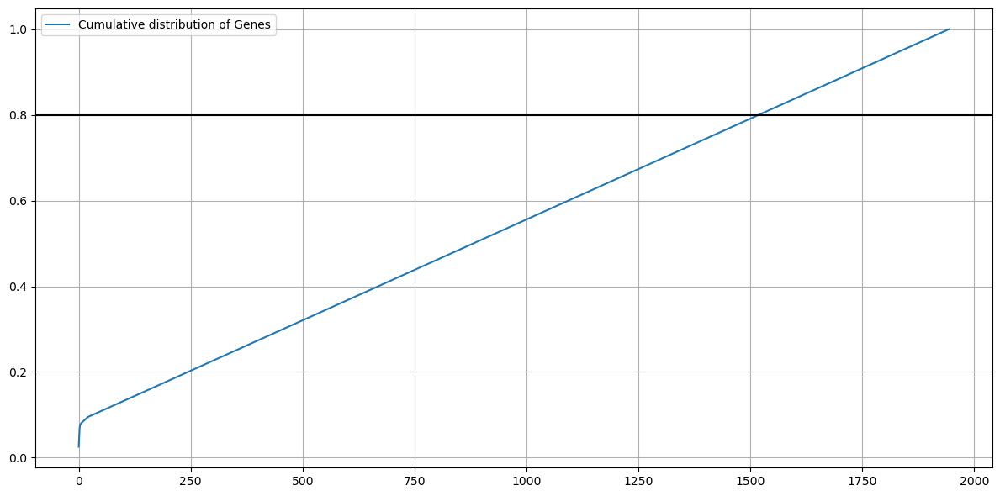

In [153]:
total_unique_values = sum(varcount.values);
percent_per_total = varcount.values/total_unique_values;
cumulative = np.cumsum(percent_per_total)
plt.plot(cumulative,label='Cumulative distribution of Genes',)

plt.grid()
plt.axhline(0.80, color='k')
plt.legend()
plt.tight_layout()
plt.show()


In [154]:
#response coding
# alpha is used for laplace smoothing
alpha = 1
# train gene feature
train_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", train_df))
# test gene feature
test_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", test_df))
# cross validation gene feature
cv_variation_feature_responseCoding = np.array(get_gv_feature(alpha, "Variation", cv_df))

In [155]:
train_variation_feature_responseCoding.shape

(2124, 9)

In [156]:
#onehot encoding
var_vectorizer = CountVectorizer()

train_variation_feature_onehotCoding =  var_vectorizer.fit_transform(train_df['Variation'])
test_variation_feature_onehotCoding  =  var_vectorizer.transform(test_df['Variation'])
cv_variation_feature_onehotCoding    =  var_vectorizer.transform(cv_df['Variation'])

In [157]:
train_variation_feature_onehotCoding .shape

(2124, 1969)

In [158]:
test_train_cover=test_df[test_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]
cv_train_cover=cv_df[cv_df['Variation'].isin(list(set(train_df['Variation'])))].shape[0]
test_train_ol = np.round(test_train_cover*100/test_df.shape[0],1)
cv_train_ol =  np.round(cv_train_cover*100/cv_df.shape[0],1)

overlapped= pd.DataFrame(data=[[test_train_ol,cv_train_ol]],columns=['Test-Train Data Overlap[%]','CV-Train Data Overlap[%]'])

alpha = [10 ** x for x in range(-5, 1)]

tunning_df = alpha_loss(alpha,train_gene_feature_onehotCoding,cv_gene_feature_onehotCoding)

best_alpha = tunning_df.loc[tunning_df['cv_log_loss'] == tunning_df['cv_log_loss'].min(), 'alpha'].item()


feat_rep = all_set('Variation',best_alpha,
                         train_variation_feature_onehotCoding,
                         cv_variation_feature_onehotCoding,
                         test_variation_feature_onehotCoding)

variation_report=pd.concat([feat_rep,overlapped],axis=1)
variation_report

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

,Feature,best alpha,train_log_loss,cv_log_loss,test_log_loss,Test-Train Data Overlap[%],CV-Train Data Overlap[%]
0,Variation,0.0001,0.662,1.71,1.686,12.3,11.3


### In compared to the train, the CV and Test log loss is significantly larger. The coverage of variation data is most likely poor. Let's see what happens.

### 5.3 Evaluating Text column

In [159]:
# cls_text is a data frame
# for every row in data fram consider the 'TEXT'
# split the words by space
# make a dict with those words
# increment its count whenever we see that word
from collections import defaultdict
def extract_dictionary_paddle(cls_text):
    dictionary = defaultdict(int)
    for index, row in cls_text.iterrows():
        for word in row['TEXT'].split():
            dictionary[word] +=1
    return dictionary

In [160]:
len(row['TEXT'].split())

6519

In [167]:

import math
#https://stackoverflow.com/a/1602964
def get_text_responsecoding(df):
    text_feature_responseCoding = np.zeros((df.shape[0],9))
    for i in range(0,9):
        row_index = 0
        for index, row in df.iterrows():
            sum_prob = 0
            for word in row['TEXT'].split():
                sum_prob += math.log(((dict_list[i].get(word,0)+10 )/(total_dict.get(word,0)+90)))
            text_feature_responseCoding[row_index][i] = math.exp(sum_prob/6519)
            row_index += 1
    return text_feature_responseCoding

In [183]:
# building a CountVectorizer with all the words that occured minimum 3 times in train data
text_vectorizer = CountVectorizer(min_df=3)
train_text_feature_onehotCoding = text_vectorizer.fit_transform(train_df['TEXT'])
# getting all the feature names (words)
train_text_features= text_vectorizer.get_feature_names_out()
doc_names = ['Doc{:d}'.format(idx) for idx, _ in enumerate(train_text_feature_onehotCoding)]

#print(train_text_features)
sample_df = pd.DataFrame(data=train_text_feature_onehotCoding.toarray(), index=doc_names,columns=train_text_features)


# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_text_fea_counts = train_text_feature_onehotCoding.sum(axis=0).A1

# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
text_fea_dict = dict(zip(list(train_text_features),train_text_fea_counts))


print("Total number of unique words in train data :", len(train_text_features))

['00' '000' '0000' ... 'zytomed' 'zytovision' 'zz']
Total number of unique words in train data : 71668


In [182]:
sample_df.head()

,00,000,0000,0000001,0000002,000001,000002644,000005,00000712,000009,00001,00001figure,00002,00002158,00003,000037,00004,00005,0000588,00006,00007,00008,000088,00009,000092,0001,000103,00011,00012,00013,00014,00015,00016,0001635,00017,00018,00019,0001a,0001acd4,0001acd48,0001acd8,0001bathe,0001bimmunophenotypecd34,0001blyl1,0001c,0002,00021,00022,00023,00024,0002452,00026,00027,00029,0002a,0003,00030,0003008,00032,00033,00034,00035,00036,00037,00039,0003a,0004,00040,00041,00043,00044,00045,00048,0005,000501003,0005045,00055,0005771,00059,0006,00065,00068,0006a,0006acd1,0007,00072,00075,00079,0008,00080067,00083,0008461,00085,000882,00089,0008acd3,0009,00091,000949,000g,001,0010,001000006,00103,0011,00110,0011054,00116,001165,00117,0012,001249,001261,00127,0012a,0013,00134,0014,0014b,0015,001548,0016,00161,00164,00165,00165085013500,00169,0017,00175,001787,001798,0018,00182,00186,001881,0019,001number,002,0020,0021,002179,0022,00222,002255,0023,0024,00241531,00247,002491,0025,0026,0026a,0027,00274,002755,00279,0028,0029,002911,002a,003,0030,00300078,0031,00312,00314,00317,0032,0032a,0033,00331790,0034,0035,0036,003651,00368,0037,0038,0039,00392,003a,004,0040,00404,00405,0041,004105,00412,0042,0043,00433,004333,0044,004448,0045,004576,0046,00461910,00464,0046acd1333,0047,004739,0048,00480719,0049,00495,004mutant,005,0050,0051,00516,0052,0052021,0052283,0053,00530095,0054,0055,0055b,0057,00570369,00570715,0058,0059,0059a,005a,005fig,006,0060,00603,00609,0062,0063,0064,00640096,00642262,0065,00650758,0066,00660455,0067,006797,0068,00686,0069,007,0070,0071,00712354,007159,0072,0073,0075,0078,0079,008,0080,0082020,0083,0084,0085,008548,0086,0086c,0087,0088,008811018,00897702,009,0090,009010,00905,0091,00910680,00917,0092,0093,0094,0095,0096,0097,009735,009775,00996,01,010,0100,0101,0102,0103,0104,0105,0106,0107,010816,01082,0109,01092,010967,011,0110,0111,01114,0112,01123,01129,0113,0114,0115,0116,0117,01182,01187,0119,01192,012,01201534,01206,0121,01223,01223746777,01226,0123,0124,01243,0125,0126,0127,0128,01281169,01292,013,0131,01315,0132,01324,01325,01330,01333,0134,0139,013b,014,0140,0141,01411373,0142,01421,0144,0145,01450,0146,0147,0148,01494,015,0150,0151,01548,01560351,0157,0158,015c,016,0162,01645,0166,0167,0169aoncogenestal1,017,0174,01742,01750331,0176,0177,01785,01799,017b,018,0180,01804,0181,0183,0186,0188,019,0192,0194,0195,0197,01m,01mm,01n,02,020,0200,0201,02015,0202,02021,0203,0205,0207,0208,020805,020a,020b,021,0211,02114,02115,0212,02129,0213,02139,02142,0216,0217,0218,02180,022,02231,0225,02267,0228,023,023017,0235,0236,0237,0238,0239,024,0242,0246,0247,0248,025,0250,0251,0252,02562,02595,025mgml,026,02628,0263,02632,0264,026594,02666,0267,027,0271,0273,02730870,0274,0276,0277,0278,0279,028,0282,02831,0286,0289,02892,029,02911951,0292,0294,0297,02m,02mm,03,030,0300,0304,030662,0306aage,0307,031,0313,0315,03172,0319,03190,032,03229,03232,03253213,0325901,033,03300,0331,0332,0332991,0334,0335,034,0342,0345,03474,0348,03493,03499,035,03503,0351,0352,0353,03546,03552,0356,03573,0358,036,0364,0365,0367,0369,037,0370,0371,0372,0375,03762,0379,038,03849,03863,039,0392,03933,0396,03999,04,040,0401,040185,0402,04036,0404bwbc,04059,0406,04071,0408,041,0412,0413,04130,0415,04161,0418,0419,042,04224,04233,04236,043,0432,04325,0434,0435,0436,0437,0439,04397,044,0440,0444,0445,0446,04491,045,04543,04555,045a,045um,046,0467,0468,0469,046a,047,0471,0475,0477,0478,048,0482,049,0497,05,050,0500,0501,05052015,05057,051,0510,0511,05197,052,05220,05236,05261,053,0532,05321,05322,05337,0536,0539,054,05450,0547,05495,055,05516,0552,0553,0558,056,0560,05653,057,0570,0572,058,0580,0585,0588,059,05955,0596,0597,059r16,05fbs,05fold,05m,05mgml,05mm,05ugml,05wwl,05x,06,060,0600,0605,06056,0609,06093,061,0610,0611,0612,0615b,06178,0618,0619,062,06200,0625,063,06300,064,0643,0644,06463922,06465684001,065,0650,06519,0653,066,0663,0664,0669,067,067514,06759,06760,06783,067fold,068,0680,06874,069,0692,0699,06g01,06g08,06kb,06mm,06spectrum,07,070

In [169]:
dict_list = []
# dict_list =[] contains 9 dictoinaries each corresponds to a class
for i in range(1,10):
    cls_text = train_df[train_df['Class']==i]
    # build a word dict based on the words in that class
    dict_list.append(extract_dictionary_paddle(cls_text))
    # append it to dict_list

# dict_list[i] is build on i'th  class text data
# total_dict is buid on whole training text data
total_dict = extract_dictionary_paddle(train_df)


confuse_array = []
for i in train_text_features:
    ratios = []
    max_val = -1
    for j in range(0,9):
        ratios.append((dict_list[j][i]+10 )/(total_dict[i]+90))
    confuse_array.append(ratios)
confuse_array = np.array(confuse_array)

In [170]:
#response coding of text features
train_text_feature_responseCoding  = get_text_responsecoding(train_df)
test_text_feature_responseCoding  = get_text_responsecoding(test_df)
cv_text_feature_responseCoding  = get_text_responsecoding(cv_df)

In [171]:
# https://stackoverflow.com/a/16202486
# we convert each row values such that they sum to 1  
train_text_feature_responseCoding = (train_text_feature_responseCoding.T/train_text_feature_responseCoding.sum(axis=1)).T
test_text_feature_responseCoding = (test_text_feature_responseCoding.T/test_text_feature_responseCoding.sum(axis=1)).T
cv_text_feature_responseCoding = (cv_text_feature_responseCoding.T/cv_text_feature_responseCoding.sum(axis=1)).T

In [172]:
# Normalizing One_Hot_Encoding
from sklearn.preprocessing import normalize

# we use the same vectorizer that was trained on train data
train_text_feature_onehotCoding = normalize(train_text_feature_onehotCoding, axis=0)

test_text_feature_onehotCoding = text_vectorizer.transform(test_df['TEXT'])
test_text_feature_onehotCoding = normalize(test_text_feature_onehotCoding, axis=0)

cv_text_feature_onehotCoding = text_vectorizer.transform(cv_df['TEXT'])
cv_text_feature_onehotCoding = normalize(cv_text_feature_onehotCoding, axis=0)

### Below is code used to find an overal of words between sets

In [173]:
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
# .A1 turns(compresses) Matrix into Array
train_text_fea_counts = train_text_feature_onehotCoding.sum(axis=0).A1

# We will use it to check overlaps between data sets
text_fea_dict = dict(zip(list(train_text_features),train_text_fea_counts))

# Sorting dictionary based on the value ( not key ) 
sorted_text_fea_dict = dict(sorted(text_fea_dict.items(), key=lambda x: x[1] , reverse=True))
sorted_text_occur = np.array(list(sorted_text_fea_dict.values()))

def get_intersec_text(df):
    df_text_vec = CountVectorizer(min_df=3)
    df_text_fea = df_text_vec.fit_transform(df['TEXT'])
    df_text_features = df_text_vec.get_feature_names_out()

    df_text_fea_counts = df_text_fea.sum(axis=0).A1
    df_text_fea_dict = dict(zip(list(df_text_features),df_text_fea_counts))
    len1 = len(set(df_text_features))
    len2 = len(set(train_text_features) & set(df_text_features))
    return len1,len2
len1,len2 = get_intersec_text(test_df)
test_train_overlap =np.round((len2/len1)*100, 1)
len1,len2 = get_intersec_text(cv_df)
cv_train_overlap = np.round((len2/len1)*100, 1)

In [174]:
overlap= pd.DataFrame(data=[[test_train_overlap, cv_train_overlap]],columns=['Test-Train Data Overlap[%]','CV-Train Data Overlap[%]'])

# Evaluating Gene Feature
alpha = [10 ** x for x in range(-5, 1)]
# Tunning Hyper Parameter (Alpha)
tunning_df = alpha_loss(alpha,train_gene_feature_onehotCoding,cv_gene_feature_onehotCoding)
# Selecting Best Alpha
best_alpha = tunning_df.loc[tunning_df['cv_log_loss'] == tunning_df['cv_log_loss'].min(), 'alpha'].item()

# Calculating Log_Loss for all test sets
feat_rep = all_set('TEXT',best_alpha,
                         train_text_feature_onehotCoding,
                         cv_text_feature_onehotCoding,
                         test_text_feature_onehotCoding)

# Combining Report
text_report=pd.concat([feat_rep,overlap],axis=1)

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

In [175]:
all_features = pd.concat([gene_report,variation_report,text_report],axis=0)
all_features

,Feature,best alpha,train_log_loss,cv_log_loss,test_log_loss,Test-Train Data Overlap[%],CV-Train Data Overlap[%]
0,Gene,0.0001,0.984,1.227,1.147,97.0,97.4
0,Variation,0.0001,0.662,1.710,1.686,12.3,11.3
0,TEXT,0.0001,0.667,1.259,1.164,95.5,96.8


#### Seems like Variation column can be an issues, since the there is a small overalap between data sets

### 6. Feature Prepation for Machine Learning

### 6.1 Definning Model Evaluation Function

In [52]:
def report_log_loss(train_x, train_y, test_x, test_y,  clf):
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)
    sig_clf_probs = sig_clf.predict_proba(test_x)
    return log_loss(test_y, sig_clf_probs, eps=1e-15)




def eval_alpha_model_loss(alpha,train_feat_hotencode,cv_feat_hotencode):
    """
    IN: Hyperparameter Alpha, Train_Feature_onehotencoded, CV_Feature_onehotencoded
    OUT: Hyperparameter Tunning DataFrame 
    """
    cv_log_error_array=[]
    for i in alpha:
        clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
        clf.fit(train_feat_hotencode, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_feat_hotencode, y_train)
        predict_y = sig_clf.predict_proba(cv_feat_hotencode)
    
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))

    temp_df = pd.DataFrame(data={'alpha': np.round(alpha,5), 
                                 'cv_log_loss': np.round(cv_log_error_array,5)})
    return temp_df

In [53]:
def plot_matrices(y_test,predicted_y):  

    confusion = confusion_matrix(y_test, predicted_y)
    precision =(confusion/confusion.sum(axis=0))
    recall =(((confusion.T)/(confusion.sum(axis=1))).T)
    
    
    f,(ax1,ax2,ax3, axcb) = plt.subplots(1,4, 
                gridspec_kw={'width_ratios':[1,1,1,0.08]},figsize=(22,6))
    
    labels = [1,2,3,4,5,6,7,8,9]
    
    g1 = sns.heatmap(confusion,cbar=False,ax=ax1,annot=True, cmap="Blues", fmt=".3f", xticklabels=labels, yticklabels=labels,)
    g1.set_ylabel('Class')
    g1.set_xlabel('Class')
    g1.set_title('Confusion')
    g2 = sns.heatmap(precision,cmap="Blues",cbar=False,ax=ax2, annot=True,fmt=".3f", xticklabels=labels, yticklabels=labels)
    g2.set_ylabel('Class')
    g2.set_xlabel('Class')
    g2.set_yticks(labels)
    g2.set_title('Precision')
    g3 = sns.heatmap(recall,cmap="Blues",ax=ax3, cbar_ax=axcb, annot=True, fmt=".3f", xticklabels=labels, yticklabels=labels)
    g3.set_ylabel('Class')
    g3.set_xlabel('Class')
    g3.set_title('Recall')
    g3.set_yticks(labels)
    
    for ax in [g1,g2,g3]:
        tl = ax.get_xticklabels()
        ax.set_xticklabels(tl, rotation=0)
        tly = ax.get_yticklabels()
        ax.set_yticklabels(tly, rotation=0)  
    plt.show()   

def predict_and_plot_confusion_matrix(train_x, train_y,test_x, test_y, clf):
    clf.fit(train_x, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x, train_y)
    pred_y = sig_clf.predict(test_x)

    # for calculating log_loss we willl provide the array of probabilities belongs to each class
    # calculating the number of data points that are misclassified
    plot_matrices(test_y, pred_y)    

def model_performance(name,clf,best_alpha,
                 train_X_hotencode,
                 cv_X_hotencode,
                 test_X_hotencode):
    '''
    IN: Model name, Classifier, Best Alpha, and All 3 OneHotEncoded Sets 
    OUT: Log-Loss Report data frame
    '''
    # Model
    clf = clf
    clf.fit(train_X_hotencode, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_X_hotencode, train_y)
    
    train_predict_y = sig_clf.predict_proba(train_X_hotencode)
    train_log_loss = np.round(log_loss(y_train, train_predict_y, labels=clf.classes_, eps=1e-15),3)

    cv_predict_y = sig_clf.predict_proba(cv_X_hotencode)
    cv_log_loss = np.round(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    test_predict_y = sig_clf.predict_proba(test_X_hotencode)
    test_log_loss = np.round(log_loss(y_test, test_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    pred_y = sig_clf.predict(test_X_hotencode)
    
    miss_class = np.count_nonzero((pred_y- test_y))/test_y.shape[0]
    
    
    report_log_loss=[name,
                     best_alpha,
                     train_log_loss,
                     cv_log_loss,
                     test_log_loss,
                     miss_class]
    
    temp_df = pd.DataFrame([report_log_loss],columns=['Model','best alpha','train_log_loss','cv_log_loss','test_log_loss','Miss_classified(%)' ])   
    return temp_df

### 6.2 Feature Stacking
- All three hot encoded features are stacked together

In [176]:
from scipy.sparse import hstack

train_gene_var_onehotCoding = hstack((train_gene_feature_onehotCoding,train_variation_feature_onehotCoding))
test_gene_var_onehotCoding = hstack((test_gene_feature_onehotCoding,test_variation_feature_onehotCoding))
cv_gene_var_onehotCoding = hstack((cv_gene_feature_onehotCoding,cv_variation_feature_onehotCoding))

train_x_onehotCoding = hstack((train_gene_var_onehotCoding, train_text_feature_onehotCoding)).tocsr()
train_y = np.array(list(train_df['Class']))

test_x_onehotCoding = hstack((test_gene_var_onehotCoding, test_text_feature_onehotCoding)).tocsr()
test_y = np.array(list(test_df['Class']))

cv_x_onehotCoding = hstack((cv_gene_var_onehotCoding, cv_text_feature_onehotCoding)).tocsr()
cv_y = np.array(list(cv_df['Class']))

train_gene_var_responseCoding = np.hstack((train_gene_feature_responseCoding,train_variation_feature_responseCoding))
test_gene_var_responseCoding = np.hstack((test_gene_feature_responseCoding,test_variation_feature_responseCoding))
cv_gene_var_responseCoding = np.hstack((cv_gene_feature_responseCoding,cv_variation_feature_responseCoding))

train_x_responseCoding = np.hstack((train_gene_var_responseCoding, train_text_feature_responseCoding))
test_x_responseCoding = np.hstack((test_gene_var_responseCoding, test_text_feature_responseCoding))
cv_x_responseCoding = np.hstack((cv_gene_var_responseCoding, cv_text_feature_responseCoding))

In [199]:
print("One hot encoding features :")
print("(number of data points * number of features) in train data = ", train_x_onehotCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_onehotCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_onehotCoding.shape)

One hot encoding features :
(number of data points * number of features) in train data =  (2124, 73874)
(number of data points * number of features) in test data =  (665, 73874)
(number of data points * number of features) in cross validation data = (532, 73874)


In [200]:
print(" Response encoding features :")
print("(number of data points * number of features) in train data = ", train_x_responseCoding.shape)
print("(number of data points * number of features) in test data = ", test_x_responseCoding.shape)
print("(number of data points * number of features) in cross validation data =", cv_x_responseCoding.shape)

 Response encoding features :
(number of data points * number of features) in train data =  (2124, 27)
(number of data points * number of features) in test data =  (665, 27)
(number of data points * number of features) in cross validation data = (532, 27)


### 6.3 TF_IDF

In [193]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm


In [185]:
# source: https://buhrmann.github.io/tfidf-analysis.html
def top_tfidf_feats(row, features, top_n):
   ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
   topn_ids = np.argsort(row)[::-1][:top_n]
   top_feats = [(features[i], row[i]) for i in topn_ids]
   df = pd.DataFrame(top_feats)
   df.columns = ['feature', 'tfidf']
   return df

In [188]:
text_vectorizer = TfidfVectorizer()
transformed = text_vectorizer.fit_transform(df_train['TEXT'])
features = text_vectorizer.get_feature_names_out()

In [189]:
top_words = top_tfidf_feats(transformed[1,:].toarray()[0],features,2000)

In [190]:
top_features = top_words['feature'].tolist()

In [191]:
def remove(var):
    if (var in top_features):
        return True
    else:
        return False

In [194]:
after_removing = []
for text_data in tqdm(df_train['TEXT'].values):
    words = text_data.split()
    filtered = filter(remove,words)
    after_removing.append(" ".join([i for i in filtered])) 

100%|██████████████████████████████████████████████████████████████████████████████| 3321/3321 [14:08<00:00,  3.91it/s]


In [195]:
df_train['TEXT'] = after_removing

In [196]:
df_train.to_csv('2000_words')

In [197]:
df_train = pd.read_csv('2000_words')

In [198]:
df_train.head()

,Unnamed: 0,ID,Gene,Variation,Class,TEXT
0,0,0,FAM58A,Truncating_Mutations,1,mutations associated leukemia somatic many pro...
1,1,1,CBL,W802*,2,abstract background nonsmall cell lung cancer ...
2,2,2,CBL,Q249E,2,abstract background nonsmall cell lung cancer ...
3,3,3,CBL,N454D,3,recent evidence demonstrated acquired uniparen...
4,4,4,CBL,L399V,4,oncogenic mutations casitas blineage lymphoma ...


# 7 Model Evaluation

## 7.1 Naive Bayes












In [253]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, accuracy_score
from sklearn.model_selection import cross_val_predict





In [238]:
def alpha_loss(alpha,train_feat_hotencode,cv_feat_hotencode):
    """
    Input: Hyperparameter Alpha, Train_Feature_onehotencoded, CV_Feature_onehotencoded
    Output: Hyperparameter Tunning DataFrame 
    """
    cv_log_error_array=[]
    for i in alpha:
        print("for alpha =", i)
        clf = MultinomialNB(alpha=i)
        clf.fit(train_feat_hotencode, train_y)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_feat_hotencode, train_y)
        predict_y = sig_clf.predict_proba(cv_feat_hotencode)
        #cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        # to avoid rounding error while multiplying probabilites we use log-probability estimates 
    
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(cv_y, predict_y))

    temp_df = pd.DataFrame(data={'alpha': np.round(alpha,5), 
                                 'cv_log_loss': np.round(cv_log_error_array,5)})
    return temp_df

In [239]:
def all_set(best_alpha,
                 train_feat_hotencode,
                 cv_feat_hotencode,
                 test_feat_hotencode):
    '''
    Input: Feature name, Best Alpha, and All 3 OneHotEncoded Sets 
    Output: Log-Loss Report data frame
    '''
    # Model
    clf = MultinomialNB(alpha=best_alpha)
    clf.fit(train_feat_hotencode, train_y)
    sigmoid_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sigmoid_clf.fit(train_feat_hotencode, train_y)
    
    train_predict_y = sigmoid_clf.predict_proba(train_feat_hotencode)
    train_log_loss = np.round(log_loss(y_train, train_predict_y, labels=clf.classes_, eps=1e-15),3)

    cv_predict_y = sigmoid_clf.predict_proba(cv_feat_hotencode)
    cv_log_loss = np.round(log_loss(y_cv, cv_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    test_predict_y = sigmoid_clf.predict_proba(test_feat_hotencode)
    test_log_loss = np.round(log_loss(y_test, test_predict_y, labels=clf.classes_, eps=1e-15),3)
    
    report_log_loss=[
                     best_alpha,
                     train_log_loss,
                     cv_log_loss,
                     test_log_loss]
    
    temp_df = pd.DataFrame([report_log_loss],columns=['best alpha','train_log_loss','cv_log_loss','test_log_loss' ])   
    return temp_df

In [240]:
# Evaluating Gene Feature
alpha = [10 ** x for x in range(-5, 1)]
# Tunning Hyper Parameter (Alpha)
tunning_df = alpha_loss(alpha,train_gene_feature_onehotCoding,cv_gene_feature_onehotCoding)
# Selecting Best Alpha
best_alpha = tunning_df.loc[tunning_df['cv_log_loss'] == tunning_df['cv_log_loss'].min(), 'alpha'].item()

# Calculating Log_Loss for all test sets
clf= all_set(best_alpha,train_x_onehotCoding,cv_x_onehotCoding,
                         test_x_onehotCoding)
report=pd.concat([clf],axis=1)
report


for alpha = 1e-05
Log Loss : 1.29796301915831
for alpha = 0.0001
Log Loss : 1.2979471064065686
for alpha = 0.001
Log Loss : 1.297790260903913
for alpha = 0.01
Log Loss : 1.296418942634373
for alpha = 0.1
Log Loss : 1.2911675617892284
for alpha = 1
Log Loss : 1.301378295254906


,best alpha,train_log_loss,cv_log_loss,test_log_loss
0,0.1,0.852,1.327,1.259


Log Loss : 1.3269983499279183
Number of missclassified point : 0.42105263157894735


C:\Users\reetu raj harsh\AppData\Local\Temp\ipykernel_14236\2302150381.py:6: RuntimeWarning: invalid value encountered in divide
  precision =(confusion/confusion.sum(axis=0))


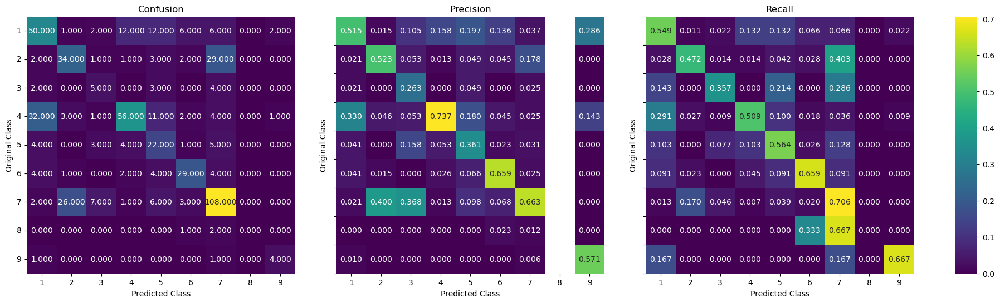

In [243]:
clf = MultinomialNB(alpha=best_alpha)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)
sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
# to avoid rounding error while multiplying probabilites we use log-probability estimates
print("Log Loss :",log_loss(cv_y, sig_clf_probs))
print("Number of missclassified point :", np.count_nonzero((sig_clf.predict(cv_x_onehotCoding)- cv_y))/cv_y.shape[0])
plot_matrices(cv_y, sig_clf.predict(cv_x_onehotCoding.toarray()))

In [244]:
# this function will be used just for naive bayes
# for the given indices, we will print the name of the features
# and we will check whether the feature present in the test point text or not
def get_impfeature_names(indices, text, gene, var, no_features):
    gene_count_vec = CountVectorizer()
    var_count_vec = CountVectorizer()
    text_count_vec = CountVectorizer(min_df=3)
    
    gene_vec = gene_count_vec.fit(train_df['Gene'])
    var_vec  = var_count_vec.fit(train_df['Variation'])
    text_vec = text_count_vec.fit(train_df['TEXT'])
    
    fea1_len = len(gene_vec.get_feature_names_out())
    fea2_len = len(var_count_vec.get_feature_names_out())
    
    word_present = 0
    for i,v in enumerate(indices):
        if (v < fea1_len):
            word = gene_vec.get_feature_names_out()[v]
            yes_no = True if word == gene else False
            if yes_no:
                word_present += 1
                print(i, "Gene feature [{}] present in test data point [{}]".format(word,yes_no))
        elif (v < fea1_len+fea2_len):
            word = var_vec.get_feature_names_out()[v-(fea1_len)]
            yes_no = True if word == var else False
            if yes_no:
                word_present += 1
                print(i, "variation feature [{}] present in test data point [{}]".format(word,yes_no))
        else:
            word = text_vec.get_feature_names_out()[v-(fea1_len+fea2_len)]
            yes_no = True if word in text.split() else False
            if yes_no:
                word_present += 1
                print(i, "Text feature [{}] present in test data point [{}]".format(word,yes_no))

    print("Out of the top ",no_features," features ", word_present, "are present in query point")

In [251]:
test_point_index = 100
no_feature = 100
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.feature_log_prob_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

Predicted Class : 1
Predicted Class Probabilities: [[0.5728 0.0842 0.014  0.1084 0.0355 0.0379 0.1366 0.0059 0.0046]]
Actual Class : 1
--------------------------------------------------
Out of the top  100  features  0 are present in query point


In [248]:
test_point_index = 100
no_feature = 100
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.feature_log_prob_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

Predicted Class : 1
Predicted Class Probabilities: [[0.5728 0.0842 0.014  0.1084 0.0355 0.0379 0.1366 0.0059 0.0046]]
Actual Class : 1
--------------------------------------------------
Out of the top  100  features  0 are present in query point


## 7.2 KNN

for alpha = 5
Log Loss : 1.0944882757898236
for alpha = 11
Log Loss : 1.0961264727997992
for alpha = 15
Log Loss : 1.0908081352250996
for alpha = 21
Log Loss : 1.096693707321404
for alpha = 31
Log Loss : 1.1266708484045314
for alpha = 41
Log Loss : 1.1432247687778094
for alpha = 51
Log Loss : 1.1457118098110006
for alpha = 99
Log Loss : 1.1930300436269443


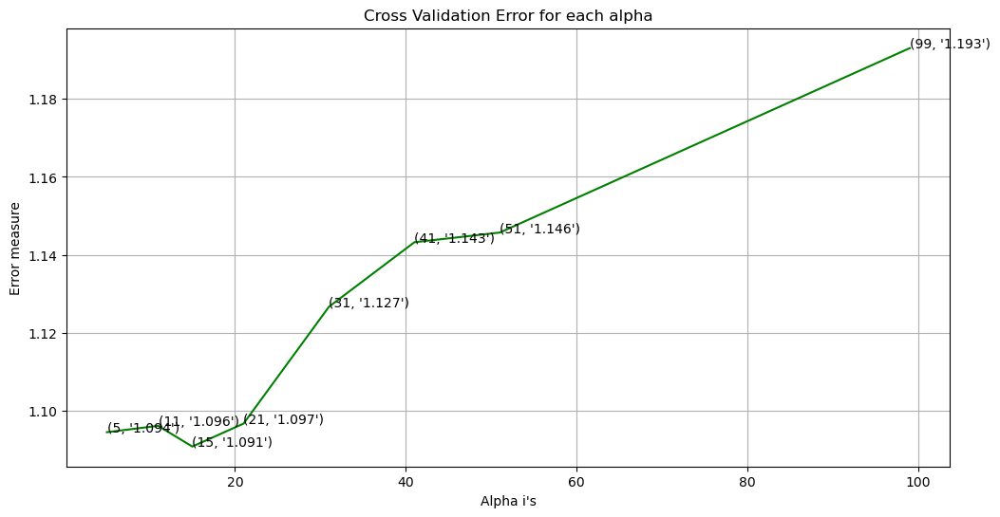

For values of best alpha =  15 The train log loss is: 0.8169138536529787
For values of best alpha =  15 The cross validation log loss is: 1.0908081352250996
For values of best alpha =  15 The test log loss is: 1.0411769773920494


In [254]:
alpha = [5, 11, 15, 21, 31, 41, 51, 99]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = KNeighborsClassifier(n_neighbors=i)
    clf.fit(train_x_responseCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_responseCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_responseCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = KNeighborsClassifier(n_neighbors=alpha[best_alpha])
clf.fit(train_x_responseCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_responseCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_responseCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_responseCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_responseCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))


C:\Users\reetu raj harsh\AppData\Local\Temp\ipykernel_14236\2302150381.py:6: RuntimeWarning: invalid value encountered in divide
  precision =(confusion/confusion.sum(axis=0))


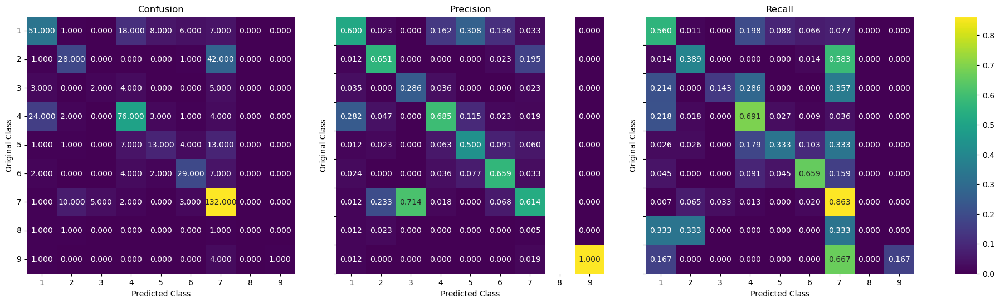

In [255]:
clf = KNeighborsClassifier(n_neighbors=alpha[best_alpha])
plot_matrices(train_x_responseCoding, train_y, cv_x_responseCoding, cv_y, clf)

In [256]:
clf = KNeighborsClassifier(n_neighbors=alpha[best_alpha])
clf.fit(train_x_responseCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_responseCoding, train_y)

test_point_index = 1
predicted_cls = sig_clf.predict(test_x_responseCoding[0].reshape(1,-1))
print("Predicted Class :", predicted_cls[0])
print("Actual Class :", test_y[test_point_index])
neighbors = clf.kneighbors(test_x_responseCoding[test_point_index].reshape(1, -1), alpha[best_alpha])
print("The ",alpha[best_alpha]," nearest neighbours of the test points belongs to classes",train_y[neighbors[1][0]])
print("Fequency of nearest points :",Counter(train_y[neighbors[1][0]]))

Predicted Class : 1
Actual Class : 6
The  15  nearest neighbours of the test points belongs to classes [4 3 5 4 4 1 4 4 4 4 6 4 4 4 4]
Fequency of nearest points : Counter({4: 11, 3: 1, 5: 1, 1: 1, 6: 1})


In [257]:
clf = KNeighborsClassifier(n_neighbors=alpha[best_alpha])
clf.fit(train_x_responseCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_responseCoding, train_y)

test_point_index = 100

predicted_cls = sig_clf.predict(test_x_responseCoding[test_point_index].reshape(1,-1))
print("Predicted Class :", predicted_cls[0])
print("Actual Class :", test_y[test_point_index])
neighbors = clf.kneighbors(test_x_responseCoding[test_point_index].reshape(1, -1), alpha[best_alpha])
print("the k value for knn is",alpha[best_alpha],"and the nearest neighbours of the test points belongs to classes",train_y[neighbors[1][0]])
print("Fequency of nearest points :",Counter(train_y[neighbors[1][0]]))

Predicted Class : 1
Actual Class : 1
the k value for knn is 15 and the nearest neighbours of the test points belongs to classes [1 1 1 5 4 4 4 4 4 4 1 4 1 1 1]
Fequency of nearest points : Counter({1: 7, 4: 7, 5: 1})


## 7.3  Logistic Regressionn

for alpha = 1e-06


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.406282438738952
for alpha = 1e-05


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.3633182516048379
for alpha = 0.0001


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.1861651716568875
for alpha = 0.001


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.194178856372761
for alpha = 0.01


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.2589139674365564
for alpha = 0.1


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.4015201741792254
for alpha = 1


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.6341413871334618
for alpha = 10


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.6716221739411505
for alpha = 100


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.6757157477651872


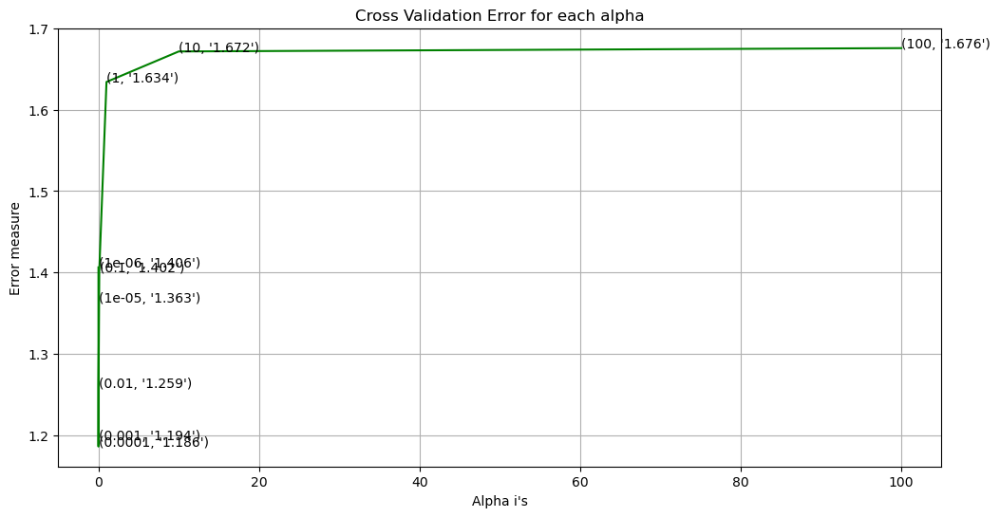

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

For values of best alpha =  0.0001 The train log loss is: 0.5188021278225844
For values of best alpha =  0.0001 The cross validation log loss is: 1.1861651716568875
For values of best alpha =  0.0001 The test log loss is: 1.1095401802233111


In [258]:
alpha = [10 ** x for x in range(-6, 3)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(class_weight='balanced', alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

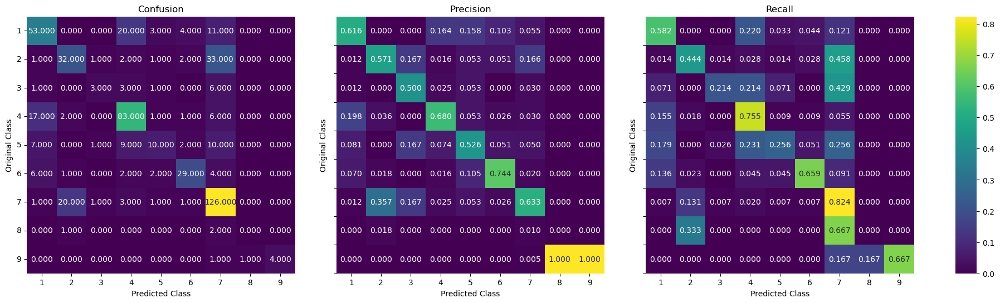

In [259]:
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

In [260]:
def get_imp_feature_names(text, indices, removed_ind = []):
    word_present = 0
    tabulte_list = []
    incresingorder_ind = 0
    for i in indices:
        if i < train_gene_feature_onehotCoding.shape[1]:
            tabulte_list.append([incresingorder_ind, "Gene", "Yes"])
        elif i< 18:
            tabulte_list.append([incresingorder_ind,"Variation", "Yes"])
        if ((i > 17) & (i not in removed_ind)) :
            word = train_text_features[i]
            yes_no = True if word in text.split() else False
            if yes_no:
                word_present += 1
            tabulte_list.append([incresingorder_ind,train_text_features[i], yes_no])
        incresingorder_ind += 1
    print(word_present, "most importent features are present in our query point")
    print("-"*50)
    print("The features that are most importent of the ",predicted_cls[0]," class:")
    print (tabulate(tabulte_list, headers=["Index",'Feature name', 'Present or Not']))

In [261]:
# from tabulate import tabulate
clf = SGDClassifier(class_weight='balanced', alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding,train_y)
test_point_index = 1
no_feature = 500
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.coef_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(


Predicted Class : 4
Predicted Class Probabilities: [[4.190e-02 6.000e-04 1.400e-03 9.362e-01 1.550e-02 1.000e-04 3.000e-04
  2.400e-03 1.600e-03]]
Actual Class : 6
--------------------------------------------------
251 Text feature [exonintron] present in test data point [True]
347 Text feature [c5266dupc] present in test data point [True]
412 Text feature [urchin] present in test data point [True]
479 Text feature [suppressor] present in test data point [True]
Out of the top  500  features  4 are present in query point


In [262]:
test_point_index = 100
no_feature = 500
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.coef_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

Predicted Class : 1
Predicted Class Probabilities: [[0.912  0.012  0.0038 0.0029 0.0039 0.0012 0.0558 0.0044 0.0039]]
Actual Class : 1
--------------------------------------------------
306 Text feature [wst8] present in test data point [True]
421 Text feature [p53regulated] present in test data point [True]
445 Text feature [1tup] present in test data point [True]
478 Text feature [r110l] present in test data point [True]
485 Text feature [aggregation] present in test data point [True]
Out of the top  500  features  5 are present in query point


for alpha = 1e-06


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.3637272718290352
for alpha = 1e-05


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.337211157877671
for alpha = 0.0001


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.2341106789711698
for alpha = 0.001


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.2100848761536782
for alpha = 0.01


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.2865373099217021
for alpha = 0.1


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.3858820379544654
for alpha = 1


C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

Log Loss : 1.5884875962231175


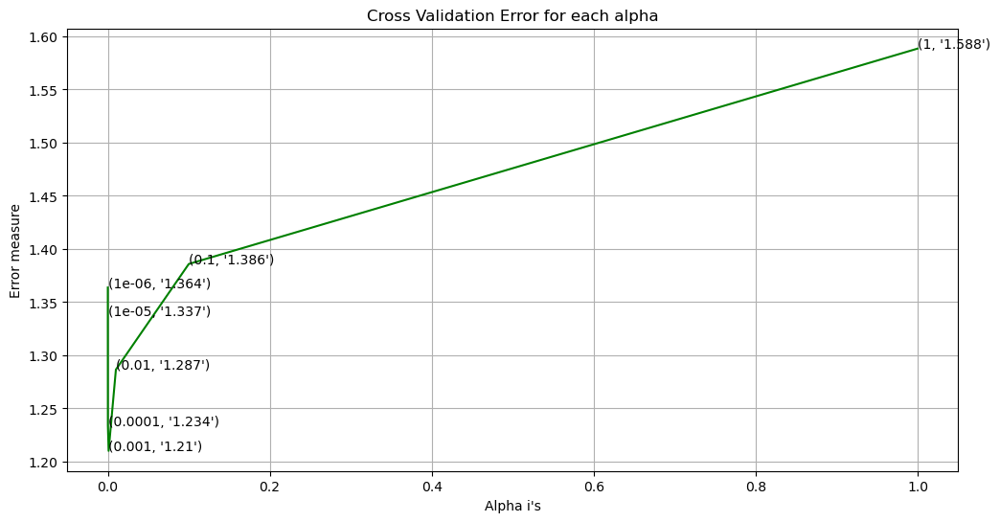

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

For values of best alpha =  0.001 The train log loss is: 0.5164817934539283
For values of best alpha =  0.001 The cross validation log loss is: 1.2100848761536782
For values of best alpha =  0.001 The test log loss is: 1.1126051148522815


In [263]:
alpha = [10 ** x for x in range(-6, 1)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_x_onehotCoding, train_y)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_x_onehotCoding, train_y)
    sig_clf_probs = sig_clf.predict_proba(cv_x_onehotCoding)
    cv_log_error_array.append(log_loss(cv_y, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(cv_y, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding, train_y)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_x_onehotCoding, train_y)

predict_y = sig_clf.predict_proba(train_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x_onehotCoding)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradie

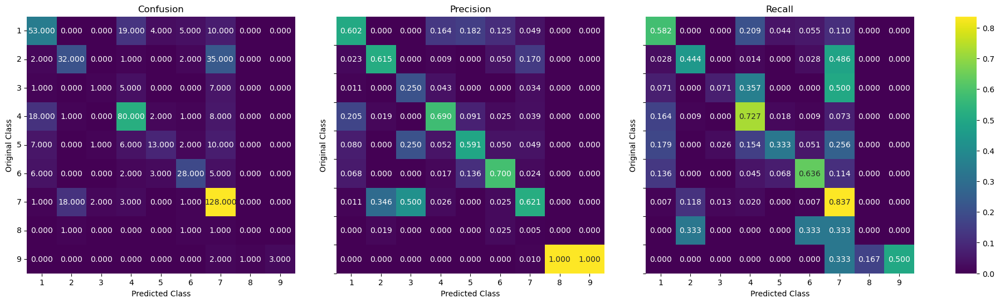

In [264]:
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
predict_and_plot_confusion_matrix(train_x_onehotCoding, train_y, cv_x_onehotCoding, cv_y, clf)

In [265]:
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_x_onehotCoding,train_y)
test_point_index = 1
no_feature = 500
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.coef_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

C:\datascience\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(


Predicted Class : 4
Predicted Class Probabilities: [[2.870e-02 0.000e+00 1.000e-04 9.246e-01 4.310e-02 1.000e-04 0.000e+00
  3.400e-03 0.000e+00]]
Actual Class : 6
--------------------------------------------------
200 Text feature [c5266dupc] present in test data point [True]
247 Text feature [suppressor] present in test data point [True]
322 Text feature [transcriptionbased] present in test data point [True]
323 Text feature [activating] present in test data point [True]
346 Text feature [m1775k] present in test data point [True]
373 Text feature [urchin] present in test data point [True]
410 Text feature [instability] present in test data point [True]
423 Text feature [inactivated] present in test data point [True]
440 Text feature [material] present in test data point [True]
454 Text feature [exonintron] present in test data point [True]
460 Text feature [habrca1] present in test data point [True]
Out of the top  500  features  11 are present in query point


In [269]:
test_point_index = 100
no_feature = 500
predicted_cls = sig_clf.predict(test_x_onehotCoding[test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(test_x_onehotCoding[test_point_index]),4))
print("Actual Class :", test_y[test_point_index])
indices = np.argsort(-1*abs(clf.coef_))[predicted_cls-1][:,:no_feature]
print("-"*50)
get_impfeature_names(indices[0], test_df['TEXT'].iloc[test_point_index],test_df['Gene'].iloc[test_point_index],test_df['Variation'].iloc[test_point_index], no_feature)

Predicted Class : 1
Predicted Class Probabilities: [[9.51e-01 5.60e-03 8.00e-04 1.51e-02 1.50e-03 9.00e-04 2.05e-02 4.50e-03
  1.00e-04]]
Actual Class : 1
--------------------------------------------------
169 Text feature [wst8] present in test data point [True]
223 Text feature [p53regulated] present in test data point [True]
261 Text feature [r110l] present in test data point [True]
306 Text feature [dnadamaging] present in test data point [True]
322 Text feature [aggregation] present in test data point [True]
365 Text feature [kinase] present in test data point [True]
367 Text feature [v157f] present in test data point [True]
378 Text feature [p73] present in test data point [True]
381 Text feature [scaber] present in test data point [True]
388 Text feature [transforming] present in test data point [True]
421 Text feature [1tup] present in test data point [True]
456 Text feature [pa1] present in test data point [True]
464 Text feature [frameshift] present in test data point [True]
